In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#import enefit
import holidays
import datetime
import seaborn as sns

from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

import warnings
warnings.filterwarnings('ignore')

In [4]:
train = pd.read_csv('../Enefit_Datasets/train.csv')
gas_df = pd.read_csv('../Enefit_Datasets/gas_prices.csv')
electricity_df = pd.read_csv('../Enefit_Datasets/electricity_prices.csv')
client_df = pd.read_csv('../Enefit_Datasets/client.csv')
fw_df = pd.read_csv('../Enefit_Datasets/forecast_weather.csv')
hw_df = pd.read_csv('../Enefit_Datasets/historical_weather.csv')
locations = pd.read_csv('../Enefit_Datasets/county_lon_lats.csv')

In [5]:
def TrainPreprocessing(train, client_df, fw_df, electricity_df, gas_df, locations, hw_df):
    '''Train data preprocessing'''
    
    # Drop nan values
    train = train[train['target'].notnull()]
    
    # Converting to datetime & date feature engineering
    train['datetime'] = pd.to_datetime(train['datetime'], utc=True)
    
    train['year'] = train['datetime'].dt.year
    train['quarter'] = train['datetime'].dt.quarter
    train['month'] = train['datetime'].dt.month
    train['week'] = train['datetime'].dt.isocalendar().week
    train['day'] = train['datetime'].dt.day
    train['hour'] = train['datetime'].dt.hour
    train['dayofweek'] = train['datetime'].dt.dayofweek
    train['dayofyear'] = train['datetime'].dt.dayofyear

    train['week'] = train['week'].astype('int32')
    
    train["jan_flag"] = (train["month"] == 1).astype(int)

    # Client data processing
    # Subtracting 2 from data_block_id. Data is two steps ahead
    client_df['data_block_id'] -= 2
    
    # Average installed capacity. (installed_capacity / eic_count)
    client_df['avg_installed_cap'] = client_df['installed_capacity'] / client_df['eic_count']

    
    # Electricity data processing
    # Renaming (forecast_date) to (datetime) for merging with the train data later
    electricity_df = electricity_df.rename(columns= {'forecast_date' : 'datetime'})
    
    # Converting (datetime) column to datetime
    electricity_df['datetime'] = pd.to_datetime(electricity_df['datetime'], utc= True)
    
    electricity_df['hour'] = electricity_df['datetime'].dt.hour
    
    # Locations data processing
    # Drop
    locations = locations.drop('Unnamed: 0', axis= 1) 
        

    # Forecast Weather 
    # 1. Rounding lat & lon to 1 decimal place
    # 2. Merge counties data from locations DF to lat & lon in forecast weather df
    # 3. Drop null rows
    # 4. Convert county col to int dtype
    # 5. Drop un-necessary columns
    # 6. Rename date column to 'datetime' and convert to datetime dtype
    # 7. New df with mean weather values per hour. Convert datetime back to normal datetime format in new df.
    # 8. New df with mean values per hour grouped also by county. Convert datetime col back to datetime.
    
    # 1.
    fw_df[['latitude', 'longitude']] = fw_df[['latitude', 'longitude']].astype(float).round(1)
    
    # 2.
    fw_df = fw_df.merge(locations, how='left', on=['latitude', 'longitude'])
    
    # 3.
    fw_df.dropna(axis=0, inplace=True)
    
    # 4.
    fw_df['county'] = fw_df['county'].astype('int64')
    
    # 5.
    fw_df.drop(['origin_datetime', 'latitude', 'longitude', 'hours_ahead',
               'data_block_id'], axis=1, inplace=True)
    
    # 6.
    fw_df.rename(columns={'forecast_datetime': 'datetime'}, inplace=True)
    fw_df['datetime'] = pd.to_datetime(fw_df['datetime'], utc=True)
    
    # 7.
    fw_df_mean = fw_df.groupby([fw_df['datetime']
                                .dt.to_period('h')])[list(fw_df.drop(['county', 'datetime'], axis=1)
                                                                           .columns)].mean().reset_index()
    fw_df_mean['datetime'] = pd.to_datetime(fw_df_mean['datetime'].dt.to_timestamp(), utc=True)
    
    # 8. 
    fw_df_county = fw_df.groupby(['county', fw_df['datetime'].dt.to_period('h')])[list(fw_df.drop(['county', 'datetime'], axis=1).columns)].mean().reset_index()
    fw_df_county['datetime'] = pd.to_datetime(fw_df_county['datetime'].dt.to_timestamp(), utc=True)

    
    # Historical weather df processing
    # 1. Rounding lat & lon to 1 decimal place
    # 2. Merge counties data from locations DF to lat & lon in forecast weather df
    # 3. Drop null rows
    # 4. Convert county col to int dtype
    # 5. Drop un-necessary columns
    # 6. Rename date column to 'datetime' and convert to datetime dtype
    # 7. New df with mean weather values per hour. Convert datetime back to normal datetime format in new df.
    # 8. New df with mean values per hour grouped also by county. Convert datetime col back to datetime.
    # 9. Merge data_block_id back to new county df
   
    # 1.
    hw_df[['latitude', 'longitude']] = hw_df[['latitude', 'longitude']].astype(float).round(1)
    
    # 2.
    hw_df = hw_df.merge(locations, how='left', on=['longitude', 'latitude'])
    
    # 3.
    hw_df.dropna(axis=0, inplace=True)
    
    # 4.
    hw_df['county'] = hw_df['county'].astype('int64')
    
    # 5.
    hw_df.drop(['latitude', 'longitude'], axis=1, inplace=True)
    
    # 6.
    hw_df['datetime'] = pd.to_datetime(hw_df['datetime'], utc=True)
    
    # 7.
    hw_df_mean = hw_df.groupby([hw_df['datetime']
                                .dt.to_period('h')])[list(hw_df.drop(['county', 'datetime', 'data_block_id'], axis=1)
                                                                           .columns)].mean().reset_index()
    hw_df_mean['datetime'] = pd.to_datetime(hw_df_mean['datetime'].dt.to_timestamp(), utc=True)
    
    hw_df_mean = hw_df_mean.merge(hw_df[['datetime', 'data_block_id']], how='left', on='datetime')
    
    # 8. 
    hw_df_county = hw_df.groupby(['county', hw_df['datetime'].dt.to_period('h')])[list(hw_df.drop(['county', 'datetime', 'data_block_id'], axis=1).columns)].mean().reset_index()
    hw_df_county['datetime'] = pd.to_datetime(hw_df_county['datetime'].dt.to_timestamp(), utc=True)
    hw_df_county = hw_df_county.merge(hw_df[['datetime', 'data_block_id']], how='left', on='datetime')
    hw_df_county.drop_duplicates(inplace=True)
    hw_df_county.reset_index()
    
    # Merge the data into train set
    # 1. Merge client 
    # 2. Merge gas
    # 3. Merge electricity
    # 4. Merge forecast weather
    # 5. Merge forecast weather by county
    # 6. Add hour col to hist weather and hist county. Drop dups and datetime col
    # 7. Merge hist weather menas
    # 8. Merge hist weather means by county
    # 9. Fill null values with forward and backward method
    # 10. Drop un-necessary cols...?

    
    # 1
    train = train.merge(client_df.drop(columns = ['date']), how='left', on = ['data_block_id', 'county', 'is_business', 'product_type'])
    
    # 2
    train = train.merge(gas_df[['data_block_id', 'lowest_price_per_mwh', 'highest_price_per_mwh']], how='left', on='data_block_id')
    
    # 3
    train = train.merge(electricity_df[['euros_per_mwh', 'hour', 'data_block_id']], how='left', on=['hour','data_block_id'])
    
    # 4 
    train = train.merge(fw_df_mean, how='left', on='datetime')
    
    # 5 
    train = train.merge(fw_df_county, how='left', on=['datetime', 'county'], suffixes = ('_fcast_mean', '_fcast_mean_by_county'))
    
    # 6
    hw_df_mean['hour'] = hw_df_mean['datetime'].dt.hour
    hw_df_county['hour'] = hw_df_county['datetime'].dt.hour
    
    hw_df_mean.drop_duplicates(inplace=True)
    hw_df_county.drop_duplicates(inplace=True)
    hw_df_mean.drop('datetime', axis=1, inplace=True)
    hw_df_county.drop('datetime', axis=1, inplace=True)

    # 7
    train = train.merge(hw_df_mean, how='left', on=['data_block_id', 'hour'])
    
    # 8 
    train = train.merge(hw_df_county, how='left', on=['data_block_id', 'county', 'hour'], suffixes= ('_hist_mean', '_hist_mean_by_county'))
    
    # 9
    train = train.groupby(['year', 'day', 'hour'], as_index=False).apply(lambda x: x.ffill().bfill()).reset_index()
    
    # 10
    train.drop(['row_id', 'data_block_id'], axis = 1, inplace = True)
    
    # Normalize target by dividing against installed capacity
    train['installed_capacity'] = train['installed_capacity'].fillna(1000)
    train['target'] = train['target'] / train['installed_capacity']

    return train

In [6]:
def is_holiday(dataframe):
    '''Creates is_holiday boolean column for Estonian country wide holidays'''
    estonian_holidays = holidays.country_holidays('EE', years=range(2021, 2024))
    estonian_holidays = list(estonian_holidays.keys())

    
    dataframe['is_holiday'] = dataframe.apply(lambda row: (datetime.date(row['year'], row['month'], row['day']) in estonian_holidays) * 1, axis=1)
    return dataframe

In [7]:
def create_target_lags(df, N_lags):
    '''Lag target variables are a form of feature engineering that gives
    the model context for what the target was N days ago'''
    
    # Store datetime column in a python object
    og_datetime = df['datetime']
    
    # Store important variables to reference with target
    target_and_friends = df[['datetime', 'prediction_unit_id', 'is_consumption', 'target']].copy()
    
    # Create lagged targets
    for lag in range(2, N_lags + 1): # Starts at 2, ends at set day
        target_and_friends['datetime'] = og_datetime + pd.DateOffset(lag) # Shifts dates forward by set amount (lag)
        df = df.merge(target_and_friends, how='left', on=['datetime', 'prediction_unit_id', 'is_consumption'], suffixes = ('', f'_lag_{lag}_days_ago'))
        
    return df

In [8]:
def fill_nan_with_weekly_median(df, timestamp_column='datetime'):
    """
    Fill NaN values in a DataFrame with the median from the respective week.

    Parameters:
    - df: DataFrame, the input DataFrame
    - timestamp_column: str, the column name representing the timestamp (default: 'datetime')

    Returns:
    - DataFrame with NaN values filled using weekly medians
    """
    # Step 1: Extract the week number
    df['week_number'] = df[timestamp_column].dt.isocalendar().week

    # Step 2: Calculate median for each feature within each week
    weekly_medians = df.groupby('week_number').median()

    # Step 3: Fill NaN values using the weekly medians
    for feature in df.columns:
        if feature != timestamp_column and feature != 'week_number':
            df[feature].fillna(df['week_number'].map(weekly_medians[feature]), inplace=True)

    # Drop the 'week_number' column if you don't need it anymore
    df.drop('week_number', axis=1, inplace=True)

    return df


In [9]:
# Train preprocessing
train = TrainPreprocessing(train, client_df, fw_df, electricity_df, gas_df, locations, hw_df)

# Add holidays
train = is_holiday(train)

# Add target lags
N_lags = 2
train = create_target_lags(train, N_lags) #Any number after 2

# Fill NaN values with weekly median
train = fill_nan_with_weekly_median(train, timestamp_column='datetime')

train.head()

,index,county,is_business,product_type,target,is_consumption,datetime,prediction_unit_id,year,quarter,...,cloudcover_high_hist_mean_by_county,windspeed_10m_hist_mean_by_county,winddirection_10m_hist_mean_by_county,shortwave_radiation_hist_mean_by_county,direct_solar_radiation_hist_mean_by_county,diffuse_radiation_hist_mean_by_county,is_holiday,target_lag_1_days_ago,target_lag_2_days_ago,target_lag_3_days_ago
0,0,0,0,1,0.000748,0,2021-09-01 00:00:00+00:00,0,2021,3,...,0.0,4.169444,143.0,0.0,0.0,0.0,0,0.061467,0.058378,0.056065
1,1,0,0,1,0.101365,1,2021-09-01 00:00:00+00:00,0,2021,3,...,0.0,4.169444,143.0,0.0,0.0,0.0,0,0.061467,0.058378,0.056065
2,2,0,0,2,0.000000,0,2021-09-01 00:00:00+00:00,1,2021,3,...,0.0,4.169444,143.0,0.0,0.0,0.0,0,0.061467,0.058378,0.056065
3,3,0,0,2,0.104050,1,2021-09-01 00:00:00+00:00,1,2021,3,...,0.0,4.169444,143.0,0.0,0.0,0.0,0,0.061467,0.058378,0.056065
4,4,0,0,3,0.000403,0,2021-09-01 00:00:00+00:00,2,2021,3,...,0.0,4.169444,143.0,0.0,0.0,0.0,0,0.061467,0.058378,0.056065


In [10]:
# Drop year column as its no longer needed
train.drop(['year'], axis=1, inplace=True)

In [11]:
# Further feature engineering

# Convert datetime to integer for date features
train['datetime'] = train['datetime'].astype('int64')

train['sin_hour']= (np.pi * np.sin(train['hour']) / 12)
train['cos_hour']= (np.pi * np.cos(train['hour']) / 12)
train['sin_dayofyear']= (np.pi * np.sin(train['dayofyear']) / 183)
train['cos_dayofyear']= (np.pi * np.cos(train['dayofyear']) / 183)
train['target_mean']= train[[f'target_lag_{1}_days_ago' for i in range(2, N_lags + 1)]].mean(1)
train['target_std']= train[[f'target_lag_{i}_days_ago' for i in range(2, N_lags + 1)]].std(1)
train['target_var']= train[[f'target_lag_{i}_days_ago' for i in range(2, N_lags+ 1)]].var(1)


In [12]:
train.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2017824 entries, 0 to 2017823
Data columns (total 85 columns):
 #   Column                                                  Dtype  
---  ------                                                  -----  
 0   index                                                   int64  
 1   county                                                  int64  
 2   is_business                                             int64  
 3   product_type                                            int64  
 4   target                                                  float64
 5   is_consumption                                          int64  
 6   datetime                                                int64  
 7   prediction_unit_id                                      int64  
 8   quarter                                                 int64  
 9   month                                                   int64  
 10  week                                                  

In [13]:
# Log columns with outliers
to_log= ['installed_capacity', 'euros_per_mwh', 'temperature_fcast_mean', 'dewpoint_fcast_mean',
        'cloudcover_high_fcast_mean', 'cloudcover_low_fcast_mean', 'cloudcover_mid_fcast_mean', 'cloudcover_total_fcast_mean',
        '10_metre_u_wind_component_fcast_mean', 'direct_solar_radiation_fcast_mean',
        'snowfall_fcast_mean', 'total_precipitation_fcast_mean', 'temperature_fcast_mean_by_county', 'dewpoint_fcast_mean_by_county',
        'cloudcover_high_fcast_mean_by_county', 'cloudcover_low_fcast_mean_by_county', 'cloudcover_mid_fcast_mean_by_county',
        'cloudcover_total_fcast_mean_by_county', '10_metre_u_wind_component_fcast_mean_by_county',
        'surface_solar_radiation_downwards_fcast_mean_by_county', 'snowfall_fcast_mean_by_county', 'total_precipitation_fcast_mean_by_county',
        'rain_hist_mean', 'snowfall_hist_mean', 'windspeed_10m_hist_mean_by_county', 'target_std', 'target_var','target_lag_2_days_ago','target_lag_3_days_ago', 'target_mean']
for i in to_log:
    shifted_feature = train[i] - min(train[i]) + 1e-10
    
    train[f"log_{i}"] = np.where((train[i] != 0), np.log(shifted_feature), 0) #Create new col and log the value if not 0
    


In [14]:
train.shape

(2017824, 116)

In [15]:
# Sort by datetime
train.sort_values(['datetime', 'hour'], inplace=True)

In [16]:
# Set the display options to show all rows and columns
pd.set_option('display.max_columns', None)

train.head(900000)

,index,county,is_business,product_type,target,is_consumption,datetime,prediction_unit_id,quarter,month,week,day,hour,dayofweek,dayofyear,jan_flag,eic_count,installed_capacity,avg_installed_cap,lowest_price_per_mwh,highest_price_per_mwh,euros_per_mwh,temperature_fcast_mean,dewpoint_fcast_mean,cloudcover_high_fcast_mean,cloudcover_low_fcast_mean,cloudcover_mid_fcast_mean,cloudcover_total_fcast_mean,10_metre_u_wind_component_fcast_mean,10_metre_v_wind_component_fcast_mean,direct_solar_radiation_fcast_mean,surface_solar_radiation_downwards_fcast_mean,snowfall_fcast_mean,total_precipitation_fcast_mean,temperature_fcast_mean_by_county,dewpoint_fcast_mean_by_county,cloudcover_high_fcast_mean_by_county,cloudcover_low_fcast_mean_by_county,cloudcover_mid_fcast_mean_by_county,cloudcover_total_fcast_mean_by_county,10_metre_u_wind_component_fcast_mean_by_county,10_metre_v_wind_component_fcast_mean_by_county,direct_solar_radiation_fcast_mean_by_county,surface_solar_radiation_downwards_fcast_mean_by_county,snowfall_fcast_mean_by_county,total_precipitation_fcast_mean_by_county,temperature_hist_mean,dewpoint_hist_mean,rain_hist_mean,snowfall_hist_mean,surface_pressure_hist_mean,cloudcover_total_hist_mean,cloudcover_low_hist_mean,cloudcover_mid_hist_mean,cloudcover_high_hist_mean,windspeed_10m_hist_mean,winddirection_10m_hist_mean,shortwave_radiation_hist_mean,direct_solar_radiation_hist_mean,diffuse_radiation_hist_mean,temperature_hist_mean_by_county,dewpoint_hist_mean_by_county,rain_hist_mean_by_county,snowfall_hist_mean_by_county,surface_pressure_hist_mean_by_county,cloudcover_total_hist_mean_by_county,cloudcover_low_hist_mean_by_county,cloudcover_mid_hist_mean_by_county,cloudcover_high_hist_mean_by_county,windspeed_10m_hist_mean_by_county,winddirection_10m_hist_mean_by_county,shortwave_radiation_hist_mean_by_county,direct_solar_radiation_hist_mean_by_county,diffuse_radiation_hist_mean_by_county,is_holiday,target_lag_1_days_ago,target_lag_2_days_ago,target_lag_3_days_ago,sin_hour,cos_hour,sin_dayofyear,cos_dayofyear,target_mean,target_std,target_var,log_installed_capacity,log_euros_per_mwh,log_temperature_fcast_mean,log_dewpoint_fcast_mean,log_cloudcover_high_fcast_mean,log_cloudcover_low_fcast_mean,log_cloudcover_mid_fcast_mean,log_cloudcover_total_fcast_mean,log_10_metre_u_wind_component_fcast_mean,log_direct_solar_radiation_fcast_mean,log_snowfall_fcast_mean,log_total_precipitation_fcast_mean,log_temperature_fcast_mean_by_county,log_dewpoint_fcast_mean_by_county,log_cloudcover_high_fcast_mean_by_county,log_cloudcover_low_fcast_mean_by_county,log_cloudcover_mid_fcast_mean_by_county,log_cloudcover_total_fcast_mean_by_county,log_10_metre_u_wind_component_fcast_mean_by_county,log_surface_solar_radiation_downwards_fcast_mean_by_county,log_snowfall_fcast_mean_by_county,log_total_precipitation_fcast_mean_by_county,log_rain_hist_mean,log_snowfall_hist_mean,log_windspeed_10m_hist_mean_by_county,log_target_std,log_target_var,log_target_lag_2_days_ago,log_target_lag_3_days_ago,log_target_lag_1_days_ago,log_target_mean
0,0,0,0,1,0.000748,0,1630454400000000000,0,3,9,35,1,0,2,244,0,108.0,952.89,8.823056,50.15,69.99,71.36,13.014066,10.531545,0.256954,0.213331,0.069662,0.438023,1.970332,-5.205125,0.000000,0.000000,0.0,0.0,13.279187,10.265674,0.192630,0.036087,0.005286,0.215636,2.511035,-5.096591,0.000000,0.000000,0.0,0.0,8.982667,6.233333,0.0,0.000000,1026.648000,85.293333,82.56,20.013333,1.413333,4.854074,145.973333,3.786667,1.186667,2.600000,8.840000,6.710000,0.0,0.0,1028.510000,93.3,87.6,24.200000,0.0,4.169444,143.0,0.000000,0.000000,0.0,0,0.061467,0.058378,0.056065,0.000000,0.261799,-0.014842,0.008628,0.061467,0.002710,0.000007,6.853711,4.399621,3.350600,3.349613,-1.358858,-1.544909,-2.664093,-0.825485,2.337719,0.00000,0.0,0.0,3.580888,3.559222,-1.646984,-3.321822,-5.242761,-1.534165,2.714133,0.000000,0.0,0.0,0.0,0.000000,1.427783,-5.910698,-11.821383,-2.840813,-2.881238,-2.789250,-2.789250
1,1,0,0,1,0.101365,1,1630454400000000000,0,3,9,35,1,0,2,244,

In [17]:
# drop index column
# KAGGLE UNCOMMENT train.drop(['level_0', 'level_1'], axis=1, inplace=True)
train.drop(['index'], axis=1, inplace=True)

In [18]:
# Make features floats (better for LSTMs)
train = train.astype(float)

In [19]:
train.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2017824 entries, 0 to 2017823
Data columns (total 115 columns):
 #    Column                                                      Dtype  
---   ------                                                      -----  
 0    county                                                      float64
 1    is_business                                                 float64
 2    product_type                                                float64
 3    target                                                      float64
 4    is_consumption                                              float64
 5    datetime                                                    float64
 6    prediction_unit_id                                          float64
 7    quarter                                                     float64
 8    month                                                       float64
 9    week                                                        float6

## Visualization

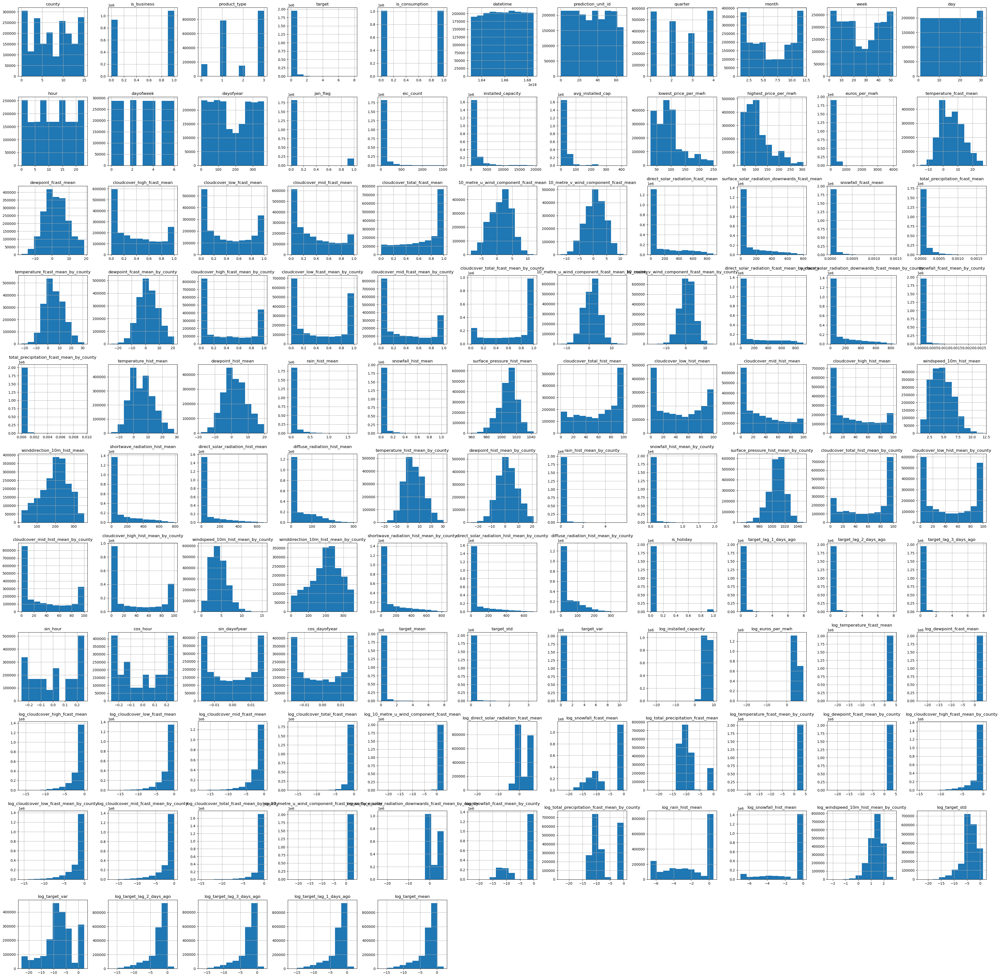

In [20]:
# Plot histogram for each variable
train.hist(figsize=(50, 50))
plt.show()

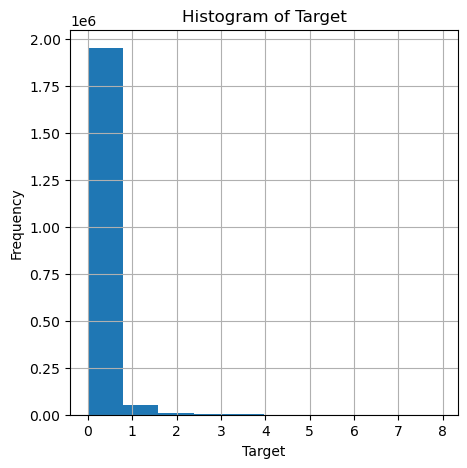

In [21]:
train['target'].hist(figsize=(5, 5))
plt.xlabel('Target')
plt.ylabel('Frequency')
plt.title('Histogram of Target')
plt.show()

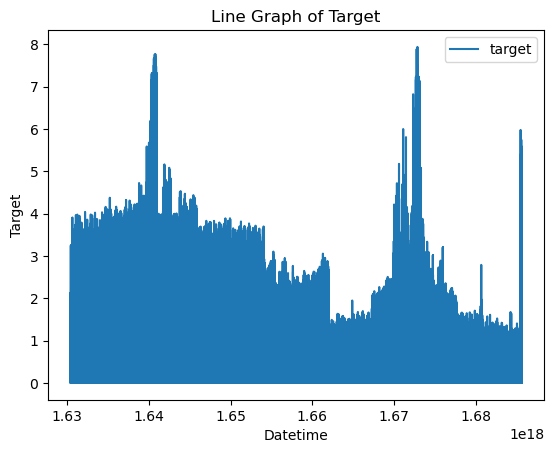

In [22]:
# Plot line graph
train.plot(x='datetime', y='target', kind='line')

# Set labels and title
plt.xlabel('Datetime')
plt.ylabel('Target')
plt.title('Line Graph of Target')

# Display the graph
plt.show()

## Modeling

In [23]:
# Select features and targets for consumption and production

consumption_X = train[train['is_consumption'] == 1].drop(['is_consumption', 'target'], axis=1)
consumption_y = train[train['is_consumption'] == 1]['target']

production_X = train[train['is_consumption'] == 0].drop(['is_consumption', 'target'], axis=1)
production_y = train[train['is_consumption'] == 0]['target']

In [24]:
# Normalize features

scaler = MinMaxScaler()
consumption_X = scaler.fit_transform(consumption_X)
production_X = scaler.fit_transform(production_X)

In [25]:
# Split into train and test sets

consumption_X_train, consumption_X_test, consumption_y_train, consumption_y_test = train_test_split(consumption_X, consumption_y, test_size=0.2, random_state=42)
production_X_train, production_X_test, production_y_train, production_y_test = train_test_split(production_X, production_y, test_size=0.2, random_state=42)


In [26]:
# Reshape features for LSTM
consumption_X_train = consumption_X_train.reshape((consumption_X_train.shape[0], 1, consumption_X_train.shape[1]))
consumption_X_test = consumption_X_test.reshape((consumption_X_test.shape[0], 1, consumption_X_test.shape[1]))

production_X_train = production_X_train.reshape((production_X_train.shape[0], 1, production_X_train.shape[1]))
production_X_test = production_X_test.reshape((production_X_test.shape[0], 1, production_X_test.shape[1]))

In [27]:
# Build LSTM model

# Consumption
consumption_model = Sequential()
consumption_model.add(LSTM(50, activation='relu', input_shape=(consumption_X_train.shape[1], consumption_X_train.shape[2])))
consumption_model.add(Dense(1))
consumption_model.compile(loss='mae', optimizer='adam')

# Production
production_model = Sequential()
production_model.add(LSTM(50, activation='relu', input_shape=(production_X_train.shape[1], production_X_train.shape[2])))
production_model.add(Dense(1))
production_model.compile(loss='mae', optimizer='adam')


Metal device set to: Apple M1 Pro

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB



2024-01-19 13:14:28.494604: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-01-19 13:14:28.499352: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [28]:
# Fit LSTM model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
consumption_history = consumption_model.fit(consumption_X_train, consumption_y_train, 
                                            epochs=1, batch_size=72, 
                                            validation_data=(consumption_X_test, consumption_y_test), 
                                            verbose=2, shuffle=False,
                                            callbacks=[early_stopping])

production_history = production_model.fit(production_X_train, production_y_train, 
                                          epochs=1, batch_size=72, 
                                          validation_data=(production_X_test, production_y_test), 
                                          verbose=2, shuffle=False, 
                                          callbacks=[early_stopping])



2024-01-19 13:14:29.428056: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2024-01-19 13:14:29.956606: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2024-01-19 13:16:32.335094: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


11211/11211 - 136s - loss: 0.0557 - val_loss: 0.0503 - 136s/epoch - 12ms/step


2024-01-19 13:16:46.685733: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2024-01-19 13:18:45.983686: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


11211/11211 - 132s - loss: 0.0225 - val_loss: 0.0206 - 132s/epoch - 12ms/step


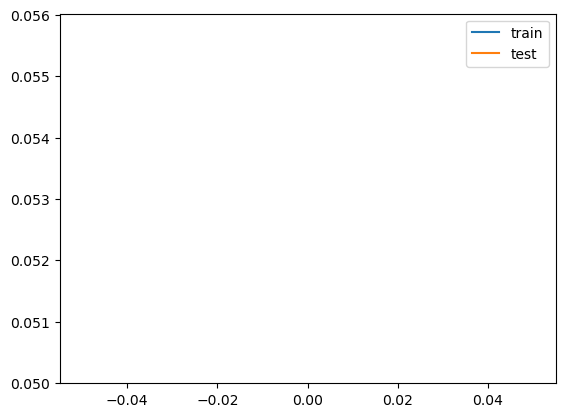

In [29]:
# Plot consumption loss
plt.plot(consumption_history.history['loss'], label='train')
plt.plot(consumption_history.history['val_loss'], label='test')
plt.legend()
plt.show()


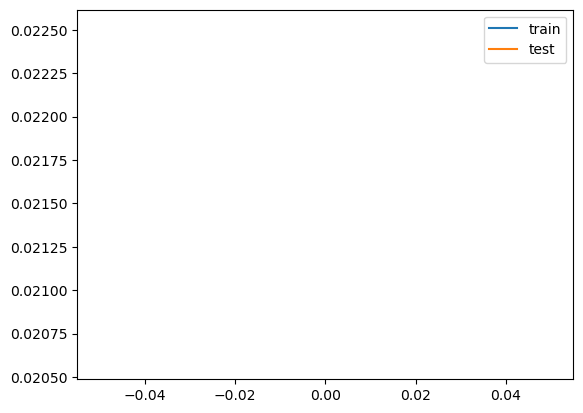

In [30]:
# Plot production loss
plt.plot(production_history.history['loss'], label='train')
plt.plot(production_history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [31]:
# Make predictions
consumption_yhat = consumption_model.predict(consumption_X_test)

production_yhat = production_model.predict(production_X_test)

  27/6306 [..............................] - ETA: 25s 

2024-01-19 13:18:59.683716: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


  28/6306 [..............................] - ETA: 24s 

2024-01-19 13:19:25.854250: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


6306/6306 [==============================] - 24s 4ms/step


In [32]:
# Evaluate MAE
from sklearn.metrics import mean_absolute_error

consumption_mae = mean_absolute_error(consumption_y_test, consumption_yhat)
print('Consumption MAE: %.3f' % consumption_mae)

production_mae = mean_absolute_error(production_y_test, production_yhat)
print('Production MAE: %.3f' % production_mae)

Consumption MAE: 0.050
Production MAE: 0.021


## Visualizing results

In [33]:
def forcasted_results_consumption(x_df, yhat_df, y_df, base_df):
    '''Returns a dataframe with the forcasted results'''

    # Reshape features from 3D to 2D
    x_df = x_df.reshape(x_df.shape[0], -1)

    y_df = np.array(y_df)
    # Convert features to dataframe
    consumption_df = pd.DataFrame(x_df)
    consumption_y = pd.DataFrame(y_df)
    consumption_yhat = pd.DataFrame(yhat_df)

    # Inverse transform features
    consumption_df = scaler.inverse_transform(consumption_df)
    consumption_df = pd.DataFrame(consumption_df)

    # Add actual targets to features dataframe
    consumption_df['actual_target'] = consumption_y
    actual_target_feat = consumption_df.pop('actual_target')
    consumption_df.insert(3, 'actual_target', actual_target_feat)

    # Add consumption column, set to 1
    consumption_df['is_consumption'] = 1
    consumption_feat = consumption_df.pop('is_consumption')
    consumption_df.insert(4, 'is_consumption', consumption_feat)
    
    #Rename columns back to origional names
    headers = base_df.columns
    consumption_df = consumption_df.rename(columns=dict(zip(consumption_df.columns, headers)))

    # Add predicted targets to features dataframe
    consumption_df['predicted_target'] = consumption_yhat
    predicted_target_feat = consumption_df.pop('predicted_target')

    # Insert the feature at the desired index
    consumption_df.insert(4, 'predicted_target', predicted_target_feat)

    # Convert to datetime format
    consumption_df['datetime'] = pd.to_datetime(consumption_df['datetime'])

    # Sort by datetime
    consumption_df.sort_values(['datetime', 'hour'], inplace=True)

    # Reset index
    consumption_df.reset_index(inplace=True)

    return consumption_df

In [34]:
consumption_df = forcasted_results_consumption(consumption_X_test, consumption_yhat, consumption_y_test, train)

In [35]:
consumption_df

,index,county,is_business,product_type,target,predicted_target,is_consumption,datetime,prediction_unit_id,quarter,month,week,day,hour,dayofweek,dayofyear,jan_flag,eic_count,installed_capacity,avg_installed_cap,lowest_price_per_mwh,highest_price_per_mwh,euros_per_mwh,temperature_fcast_mean,dewpoint_fcast_mean,cloudcover_high_fcast_mean,cloudcover_low_fcast_mean,cloudcover_mid_fcast_mean,cloudcover_total_fcast_mean,10_metre_u_wind_component_fcast_mean,10_metre_v_wind_component_fcast_mean,direct_solar_radiation_fcast_mean,surface_solar_radiation_downwards_fcast_mean,snowfall_fcast_mean,total_precipitation_fcast_mean,temperature_fcast_mean_by_county,dewpoint_fcast_mean_by_county,cloudcover_high_fcast_mean_by_county,cloudcover_low_fcast_mean_by_county,cloudcover_mid_fcast_mean_by_county,cloudcover_total_fcast_mean_by_county,10_metre_u_wind_component_fcast_mean_by_county,10_metre_v_wind_component_fcast_mean_by_county,direct_solar_radiation_fcast_mean_by_county,surface_solar_radiation_downwards_fcast_mean_by_county,snowfall_fcast_mean_by_county,total_precipitation_fcast_mean_by_county,temperature_hist_mean,dewpoint_hist_mean,rain_hist_mean,snowfall_hist_mean,surface_pressure_hist_mean,cloudcover_total_hist_mean,cloudcover_low_hist_mean,cloudcover_mid_hist_mean,cloudcover_high_hist_mean,windspeed_10m_hist_mean,winddirection_10m_hist_mean,shortwave_radiation_hist_mean,direct_solar_radiation_hist_mean,diffuse_radiation_hist_mean,temperature_hist_mean_by_county,dewpoint_hist_mean_by_county,rain_hist_mean_by_county,snowfall_hist_mean_by_county,surface_pressure_hist_mean_by_county,cloudcover_total_hist_mean_by_county,cloudcover_low_hist_mean_by_county,cloudcover_mid_hist_mean_by_county,cloudcover_high_hist_mean_by_county,windspeed_10m_hist_mean_by_county,winddirection_10m_hist_mean_by_county,shortwave_radiation_hist_mean_by_county,direct_solar_radiation_hist_mean_by_county,diffuse_radiation_hist_mean_by_county,is_holiday,target_lag_1_days_ago,target_lag_2_days_ago,target_lag_3_days_ago,sin_hour,cos_hour,sin_dayofyear,cos_dayofyear,target_mean,target_std,target_var,log_installed_capacity,log_euros_per_mwh,log_temperature_fcast_mean,log_dewpoint_fcast_mean,log_cloudcover_high_fcast_mean,log_cloudcover_low_fcast_mean,log_cloudcover_mid_fcast_mean,log_cloudcover_total_fcast_mean,log_10_metre_u_wind_component_fcast_mean,log_direct_solar_radiation_fcast_mean,log_snowfall_fcast_mean,log_total_precipitation_fcast_mean,log_temperature_fcast_mean_by_county,log_dewpoint_fcast_mean_by_county,log_cloudcover_high_fcast_mean_by_county,log_cloudcover_low_fcast_mean_by_county,log_cloudcover_mid_fcast_mean_by_county,log_cloudcover_total_fcast_mean_by_county,log_10_metre_u_wind_component_fcast_mean_by_county,log_surface_solar_radiation_downwards_fcast_mean_by_county,log_snowfall_fcast_mean_by_county,log_total_precipitation_fcast_mean_by_county,log_rain_hist_mean,log_snowfall_hist_mean,log_windspeed_10m_hist_mean_by_county,log_target_std,log_target_var,log_target_lag_2_days_ago,log_target_lag_3_days_ago,log_target_lag_1_days_ago,log_target_mean
0,219,13.0,1.0,3.0,0.650538,0.052439,1,2021-09-01 00:00:00,52.0,3.0,9.0,35.0,1.0,0.0,2.0,244.0,0.0,29.0,1152.9,39.755172,50.15,69.99,71.36,13.014066,10.531545,0.256954,0.213331,0.069662,0.438023,1.970332,-5.205125,0.0,0.0,0.0,0.0,10.058984,9.031396,0.248322,0.104279,0.066223,0.332809,1.523974,-2.439878,0.0,0.0,0.0,0.0,8.982667,6.233333,0.0,0.0,1026.648000,85.293333,82.560000,20.013333,1.413333,4.854074,145.973333,3.786667,1.186667,2.6,8.840000,6.710000,0.0,0.0,1028.510000,93.300000,87.60,24.20,0.000000,4.169444,143.000000,0.0,0.0,0.0,0.0,0.046276,0.007003,0.006726,0.00000,0.261799,-0.014842,0.008628,0.046276,0.002547,0.000006,7.045254,4.399621,3.350600,3.349613,-1.358858,-1.544909,-2.664093,-0.825485,2.337719,0.0,0.0,0.0,3.486922,3.523462,-1.393031,-2.260689,-2.714725,-1.100185,2.646491,0.0,0.0,0.0,0.0,0.0,1.427783,-11.622933,-11.989784,-4.689154,-4.727738,-3.348782,-3.348782
1,19547,8.0,0.0,1.0,0.117916,0.058225,1,202

In [36]:
# Sort the DataFrame by 'datetime' for proper time series plotting
# Plot actual vs predicted values over datetime_x
plt.figure(figsize=(150, 40))  # Adjust the figure size as needed
plt.plot(consumption_df['datetime'], consumption_df['target'], label='Actual Values', linewidth=2, color='blue')
plt.plot(consumption_df['datetime'], consumption_df['predicted_target'], label='Predicted Values', linestyle='--', linewidth=2, color='orange')
plt.xlabel('Datetime')
plt.ylabel('Values')
plt.title('Actual vs Predicted Values over Datetime')
plt.legend(loc='upper left')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()  # Improves spacing
plt.show()

In [37]:
def forcasted_results_production(x_df, yhat_df, y_df, base_df):
    '''Returns a dataframe with the forcasted results'''

    # Reshape features from 3D to 2D
    x_df = x_df.reshape(x_df.shape[0], -1)

    y_df = np.array(y_df)
    # Convert features to dataframe
    production_df = pd.DataFrame(x_df)
    production_y = pd.DataFrame(y_df)
    production_yhat = pd.DataFrame(yhat_df)

    # Inverse transform features
    production_df = scaler.inverse_transform(production_df)
    production_df = pd.DataFrame(production_df)

    # Add actual targets to features dataframe
    production_df['actual_target'] = production_y
    actual_target_feat = production_df.pop('actual_target')
    production_df.insert(3, 'actual_target', actual_target_feat)

    # Add consumption column, set to 1
    production_df['is_consumption'] = 0
    production_feat = production_df.pop('is_consumption')
    production_df.insert(4, 'is_consumption', production_feat)
    
    #Rename columns back to origional names
    headers = base_df.columns
    production_df = production_df.rename(columns=dict(zip(production_df.columns, headers)))

    # Add predicted targets to features dataframe
    production_df['predicted_target'] = production_yhat
    predicted_target_feat = production_df.pop('predicted_target')

    # Insert the feature at the desired index
    production_df.insert(4, 'predicted_target', predicted_target_feat)

    # Convert to datetime format
    production_df['datetime'] = pd.to_datetime(production_df['datetime'])

    # Sort by datetime
    production_df.sort_values(['datetime', 'hour'], inplace=True)

    # Reset index
    production_df.reset_index(inplace=True)

    return production_df

In [38]:
production_df = forcasted_results_production(production_X_test, production_yhat, production_y_test, train)

In [39]:
production_df

,index,county,is_business,product_type,target,predicted_target,is_consumption,datetime,prediction_unit_id,quarter,month,week,day,hour,dayofweek,dayofyear,jan_flag,eic_count,installed_capacity,avg_installed_cap,lowest_price_per_mwh,highest_price_per_mwh,euros_per_mwh,temperature_fcast_mean,dewpoint_fcast_mean,cloudcover_high_fcast_mean,cloudcover_low_fcast_mean,cloudcover_mid_fcast_mean,cloudcover_total_fcast_mean,10_metre_u_wind_component_fcast_mean,10_metre_v_wind_component_fcast_mean,direct_solar_radiation_fcast_mean,surface_solar_radiation_downwards_fcast_mean,snowfall_fcast_mean,total_precipitation_fcast_mean,temperature_fcast_mean_by_county,dewpoint_fcast_mean_by_county,cloudcover_high_fcast_mean_by_county,cloudcover_low_fcast_mean_by_county,cloudcover_mid_fcast_mean_by_county,cloudcover_total_fcast_mean_by_county,10_metre_u_wind_component_fcast_mean_by_county,10_metre_v_wind_component_fcast_mean_by_county,direct_solar_radiation_fcast_mean_by_county,surface_solar_radiation_downwards_fcast_mean_by_county,snowfall_fcast_mean_by_county,total_precipitation_fcast_mean_by_county,temperature_hist_mean,dewpoint_hist_mean,rain_hist_mean,snowfall_hist_mean,surface_pressure_hist_mean,cloudcover_total_hist_mean,cloudcover_low_hist_mean,cloudcover_mid_hist_mean,cloudcover_high_hist_mean,windspeed_10m_hist_mean,winddirection_10m_hist_mean,shortwave_radiation_hist_mean,direct_solar_radiation_hist_mean,diffuse_radiation_hist_mean,temperature_hist_mean_by_county,dewpoint_hist_mean_by_county,rain_hist_mean_by_county,snowfall_hist_mean_by_county,surface_pressure_hist_mean_by_county,cloudcover_total_hist_mean_by_county,cloudcover_low_hist_mean_by_county,cloudcover_mid_hist_mean_by_county,cloudcover_high_hist_mean_by_county,windspeed_10m_hist_mean_by_county,winddirection_10m_hist_mean_by_county,shortwave_radiation_hist_mean_by_county,direct_solar_radiation_hist_mean_by_county,diffuse_radiation_hist_mean_by_county,is_holiday,target_lag_1_days_ago,target_lag_2_days_ago,target_lag_3_days_ago,sin_hour,cos_hour,sin_dayofyear,cos_dayofyear,target_mean,target_std,target_var,log_installed_capacity,log_euros_per_mwh,log_temperature_fcast_mean,log_dewpoint_fcast_mean,log_cloudcover_high_fcast_mean,log_cloudcover_low_fcast_mean,log_cloudcover_mid_fcast_mean,log_cloudcover_total_fcast_mean,log_10_metre_u_wind_component_fcast_mean,log_direct_solar_radiation_fcast_mean,log_snowfall_fcast_mean,log_total_precipitation_fcast_mean,log_temperature_fcast_mean_by_county,log_dewpoint_fcast_mean_by_county,log_cloudcover_high_fcast_mean_by_county,log_cloudcover_low_fcast_mean_by_county,log_cloudcover_mid_fcast_mean_by_county,log_cloudcover_total_fcast_mean_by_county,log_10_metre_u_wind_component_fcast_mean_by_county,log_surface_solar_radiation_downwards_fcast_mean_by_county,log_snowfall_fcast_mean_by_county,log_total_precipitation_fcast_mean_by_county,log_rain_hist_mean,log_snowfall_hist_mean,log_windspeed_10m_hist_mean_by_county,log_target_std,log_target_var,log_target_lag_2_days_ago,log_target_lag_3_days_ago,log_target_lag_1_days_ago,log_target_mean
0,219,13.0,1.0,3.0,0.000000,0.005269,0,2021-09-01 00:00:00,52.0,3.0,9.0,35.0,1.0,0.0,2.0,244.0,0.0,29.0,1152.9,39.755172,50.15,69.99,71.36,13.014066,10.531545,0.256954,0.213331,0.069662,0.438023,1.970332,-5.205125,0.0,0.0,0.0,0.0,10.058984,9.031396,0.248322,0.104279,0.066223,0.332809,1.523974,-2.439878,0.0,0.0,0.0,0.0,8.982667,6.233333,0.0,0.0,1026.648000,85.293333,82.560000,20.013333,1.413333,4.854074,145.973333,3.786667,1.186667,2.6,8.840000,6.710000,0.0,0.0,1028.510000,93.300000,87.60,24.20,0.000000,4.169444,143.000000,0.0,0.0,0.0,0.0,0.061467,0.058378,0.056065,0.00000,0.261799,-0.014842,0.008628,0.061467,0.002710,7.345688e-06,7.045254,4.399621,3.350600,3.349613,-1.358858,-1.544909,-2.664093,-0.825485,2.337719,0.0,0.0,0.0,3.486922,3.523462,-1.393031,-2.260689,-2.714725,-1.100185,2.646491,0.0,0.0,0.0,0.0,0.0,1.427783,-5.910698,-11.821383,-2.840813,-2.881238,-2.789250,-2.789250
1,19547,8.0,0.0,1.0,0.000000,0.007271,0,

In [40]:
# Sort the DataFrame by 'datetime' for proper time series plotting
# Plot actual vs predicted values over datetime_x
plt.figure(figsize=(150, 40))  # Adjust the figure size as needed
plt.plot(production_df['datetime'], production_df['target'], label='Actual Values', linewidth=2, color='blue')
plt.plot(production_df['datetime'], production_df['predicted_target'], label='Predicted Values', linestyle='--', linewidth=2, color='orange')
plt.xlabel('Datetime')
plt.ylabel('Values')
plt.title('Actual vs Predicted Values over Datetime')
plt.legend(loc='upper left')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()  # Improves spacing
plt.show()

## Submission

In [48]:
test = pd.read_csv('../Enefit_Datasets/example_test_files/test.csv')
gas_test = pd.read_csv('../Enefit_Datasets/example_test_files/gas_prices.csv')
electricity_test = pd.read_csv('../Enefit_Datasets/example_test_files/electricity_prices.csv')
client_test = pd.read_csv('../Enefit_Datasets/example_test_files/client.csv')
forecast_weather_test = pd.read_csv('../Enefit_Datasets/example_test_files/forecast_weather.csv')
historical_weather_test = pd.read_csv('../Enefit_Datasets/example_test_files/historical_weather.csv')
revealed_targets = pd.read_csv('../Enefit_Datasets/example_test_files/revealed_targets.csv')
sample_prediction = pd.read_csv('../Enefit_Datasets/example_test_files/sample_submission.csv')
locations = pd.read_csv('../Enefit_Datasets/county_lon_lats.csv')

In [45]:
def TestPreprocessing(test, client_df, fw_df, electricity_df, gas_df, locations, hw_df):
    '''Test data preprocessing'''

    # Converting to datetime & date feature engineering
    test = test.rename(columns={'prediction_datetime' : 'datetime'})

    test['datetime'] = pd.to_datetime(test['datetime'], utc=True)

    test['year'] = test['datetime'].dt.year
    test['quarter'] = test['datetime'].dt.quarter
    test['month'] = test['datetime'].dt.month
    test['week'] = test['datetime'].dt.isocalendar().week
    test['day'] = test['datetime'].dt.day
    test['hour'] = test['datetime'].dt.hour
    test['dayofweek'] = test['datetime'].dt.dayofweek
    test['dayofyear'] = test['datetime'].dt.dayofyear

    test['week'] = test['week'].astype('int64')

    test["jan_flag"] = (test["month"] == 1).astype(int)

    # Subtracting 2 from data_block_id. Data is two steps ahead
    #test['data_block_id'] += 2

    # Client data processing

    client_df['avg_installed_cap'] = client_df['installed_capacity'] / client_df['eic_count']

    # Electricity data processing
    # Renaming (forecast_date) to (datetime) for merging with the test data later
    electricity_df = electricity_df.rename(columns= {'origin_date' : 'datetime'})
    
    # Converting (datetime) column to datetime
    electricity_df['datetime'] = pd.to_datetime(electricity_df['datetime'], utc= True)
    
    electricity_df['hour'] = electricity_df['datetime'].dt.hour
    
    # Locations data processing
    # Drop
    locations = locations.drop('Unnamed: 0', axis= 1) 
        

    # Forecast Weather 
    # 1. Rounding lat & lon to 1 decimal place
    # 2. Merge counties data from locations DF to lat & lon in forecast weather df
    # 3. Drop null rows
    # 4. Convert county col to int dtype
    # 5. Drop un-necessary columns
    # 6. Rename date column to 'datetime' and convert to datetime dtype
    # 7. New df with mean weather values per hour. Convert datetime back to normal datetime format in new df.
    # 8. New df with mean values per hour grouped also by county. Convert datetime col back to datetime.
    
    # 1.
    fw_df[['latitude', 'longitude']] = fw_df[['latitude', 'longitude']].astype(float).round(1)
    
    # 2.
    fw_df = fw_df.merge(locations, how='left', on=['latitude', 'longitude'])
    
    # 3.
    fw_df.dropna(axis=0, inplace=True)
    
    # 4.
    fw_df['county'] = fw_df['county'].astype('int64')
    
    # 5.
    fw_df.drop(['origin_datetime', 'latitude', 'longitude', 'hours_ahead',
               'data_block_id'], axis=1, inplace=True)
    
    # 6.
    fw_df.rename(columns={'forecast_datetime': 'datetime'}, inplace=True)
    fw_df['datetime'] = pd.to_datetime(fw_df['datetime'], utc=True)
    
    # 7.
    fw_df_mean = fw_df.groupby([fw_df['datetime']
                                .dt.to_period('h')])[list(fw_df.drop(['county', 'datetime'], axis=1)
                                                                           .columns)].mean().reset_index()
    fw_df_mean['datetime'] = pd.to_datetime(fw_df_mean['datetime'].dt.to_timestamp(), utc=True)
    
    # 8. 
    fw_df_county = fw_df.groupby(['county', fw_df['datetime'].dt.to_period('h')])[list(fw_df.drop(['county', 'datetime'], axis=1).columns)].mean().reset_index()
    fw_df_county['datetime'] = pd.to_datetime(fw_df_county['datetime'].dt.to_timestamp(), utc=True)

    
    # Historical weather df processing
    # 1. Rounding lat & lon to 1 decimal place
    # 2. Merge counties data from locations DF to lat & lon in forecast weather df
    # 3. Drop null rows
    # 4. Convert county col to int dtype
    # 5. Drop un-necessary columns
    # 6. Rename date column to 'datetime' and convert to datetime dtype
    # 7. New df with mean weather values per hour. Convert datetime back to normal datetime format in new df.
    # 8. New df with mean values per hour grouped also by county. Convert datetime col back to datetime.
    # 9. Merge data_block_id back to new county df
   
    # 1.
    hw_df[['latitude', 'longitude']] = hw_df[['latitude', 'longitude']].astype(float).round(1)
    
    # 2.
    hw_df = hw_df.merge(locations, how='left', on=['longitude', 'latitude'])
    
    # 3.
    hw_df.dropna(axis=0, inplace=True)
    
    # 4.
    hw_df['county'] = hw_df['county'].astype('int64')
    
    # 5.
    hw_df.drop(['latitude', 'longitude'], axis=1, inplace=True)
    
    # 6.
    hw_df['datetime'] = pd.to_datetime(hw_df['datetime'], utc=True)
    
    # 7.
    hw_df_mean = hw_df.groupby([hw_df['datetime']
                                .dt.to_period('h')])[list(hw_df.drop(['county', 'datetime', 'data_block_id'], axis=1)
                                                                           .columns)].mean().reset_index()
    hw_df_mean['datetime'] = pd.to_datetime(hw_df_mean['datetime'].dt.to_timestamp(), utc=True)
    
    hw_df_mean = hw_df_mean.merge(hw_df[['datetime', 'data_block_id']], how='left', on='datetime')
    
    # 8. 
    hw_df_county = hw_df.groupby(['county', hw_df['datetime'].dt.to_period('h')])[list(hw_df.drop(['county', 'datetime', 'data_block_id'], axis=1).columns)].mean().reset_index()
    hw_df_county['datetime'] = pd.to_datetime(hw_df_county['datetime'].dt.to_timestamp(), utc=True)
    hw_df_county = hw_df_county.merge(hw_df[['datetime', 'data_block_id']], how='left', on='datetime')
    hw_df_county.drop_duplicates(inplace=True)
    hw_df_county.reset_index()
    
    # Merge the data into test set
    # 1. Merge client 
    # 2. Merge gas
    # 3. Merge electricity
    # 4. Merge forecast weather
    # 5. Merge forecast weather by county
    # 6. Add hour col to hist weather and hist county. Drop dups and datetime col
    # 7. Merge hist weather menas
    # 8. Merge hist weather means by county
    # 9. Fill null values with forward and backward method
    # 10. Drop un-necessary cols...?

    
    # 1
    test = test.merge(client_df.drop(columns = ['date']), how='left', on = ['data_block_id', 'county', 'is_business', 'product_type'])
    
    # 2
    test = test.merge(gas_df[['data_block_id', 'lowest_price_per_mwh', 'highest_price_per_mwh']], how='left', on='data_block_id')
    
    # 3
    test = test.merge(electricity_df[['euros_per_mwh', 'hour', 'data_block_id']], how='left', on=['hour','data_block_id'])
    
    # 4 
    test = test.merge(fw_df_mean, how='left', on='datetime')
    
    # 5 
    test = test.merge(fw_df_county, how='left', on=['datetime', 'county'], suffixes = ('_fcast_mean', '_fcast_mean_by_county'))
    
    # 6
    hw_df_mean['hour'] = hw_df_mean['datetime'].dt.hour
    hw_df_county['hour'] = hw_df_county['datetime'].dt.hour
    
    hw_df_mean.drop_duplicates(inplace=True)
    hw_df_county.drop_duplicates(inplace=True)
    hw_df_mean.drop('datetime', axis=1, inplace=True)
    hw_df_county.drop('datetime', axis=1, inplace=True)

    # 7
    test = test.merge(hw_df_mean, how='left', on=['data_block_id', 'hour'])
    
    # 8 
    test = test.merge(hw_df_county, how='left', on=['data_block_id', 'county', 'hour'], suffixes= ('_hist_mean', '_hist_mean_by_county'))
    
    # 9
    #test = test.groupby(['year', 'day', 'hour'], as_index=False).apply(lambda x: x.ffill().bfill()).reset_index()
    
    # 9.5
    installed_capacity = test[['row_id', 'installed_capacity']]
    
    # 10
    test.drop(['row_id', 'data_block_id'], axis = 1, inplace = True)
    # IN KAGGLE: , 'level_0', 'level_1'
    # Fill in missing values
    test['installed_capacity'] = test['installed_capacity'].fillna(1000)

    
    return test, installed_capacity

## Test submission data engineering

In [42]:
test

,county,is_business,product_type,is_consumption,prediction_datetime,data_block_id,row_id,prediction_unit_id,currently_scored
0,0,0,1,0,2023-05-28 00:00:00,634,2005872,0,False
1,0,0,1,1,2023-05-28 00:00:00,634,2005873,0,False
2,0,0,2,0,2023-05-28 00:00:00,634,2005874,1,False
3,0,0,2,1,2023-05-28 00:00:00,634,2005875,1,False
4,0,0,3,0,2023-05-28 00:00:00,634,2005876,2,False
...,...,...,...,...,...,...,...,...,...
12475,15,1,0,1,2023-05-31 23:00:00,637,2018347,64,False
12476,15,1,1,0,2023-05-31 23:00:00,637,2018348,59,False
12477,15,1,1,1,2023-05-31 23:00:00,637,2018349,59,False
12478,15,1,3,0,2023-05-31 23:00:00,637,2018350,60,False


In [43]:
gas_test

,forecast_date,lowest_price_per_mwh,highest_price_per_mwh,origin_date,data_block_id
0,2023-05-27,28.30,34.10,2023-05-26,634
1,2023-05-28,28.10,34.10,2023-05-27,635
2,2023-05-29,28.16,36.98,2023-05-28,636
3,2023-05-30,29.00,34.00,2023-05-29,637


In [44]:
electricity_test

,forecast_date,euros_per_mwh,origin_date,data_block_id
0,2023-05-27 00:00:00,87.54,2023-05-26 00:00:00,634
1,2023-05-27 01:00:00,82.69,2023-05-26 01:00:00,634
2,2023-05-27 02:00:00,82.70,2023-05-26 02:00:00,634
3,2023-05-27 03:00:00,84.26,2023-05-26 03:00:00,634
4,2023-05-27 04:00:00,87.67,2023-05-26 04:00:00,634
...,...,...,...,...
91,2023-05-30 19:00:00,82.10,2023-05-29 19:00:00,637
92,2023-05-30 20:00:00,150.85,2023-05-29 20:00:00,637
93,2023-05-30 21:00:00,82.10,2023-05-29 21:00:00,637
94,2023-05-30 22:00:00,82.09,2023-05-29 22:00:00,637


In [45]:
client_test

,product_type,county,eic_count,installed_capacity,is_business,date,data_block_id
0,1,0,507,4960.215,0,2023-05-26,634
1,2,0,11,34.000,0,2023-05-26,634
2,3,0,1516,15977.560,0,2023-05-26,634
3,0,0,25,1273.200,1,2023-05-26,634
4,1,0,98,2885.600,1,2023-05-26,634
...,...,...,...,...,...,...,...
257,1,15,51,415.600,0,2023-05-29,637
258,3,15,161,2035.750,0,2023-05-29,637
259,0,15,15,620.000,1,2023-05-29,637
260,1,15,20,624.500,1,2023-05-29,637


In [46]:
forecast_weather_test

,latitude,longitude,origin_datetime,hours_ahead,temperature,dewpoint,cloudcover_high,cloudcover_low,cloudcover_mid,cloudcover_total,10_metre_u_wind_component,10_metre_v_wind_component,data_block_id,forecast_datetime,direct_solar_radiation,surface_solar_radiation_downwards,snowfall,total_precipitation
0,57.6,21.7,2023-05-26 23:00:00+00:00,1,9.859155,5.508813,0.000000,0.000000,0.026901,0.026901,3.616620,-1.281012,634,2023-05-27 00:00:00+00:00,0.0,0.0,0.0,0.0
1,57.6,22.2,2023-05-26 23:00:00+00:00,1,5.916284,4.613428,0.000000,0.000000,0.000000,0.000000,2.164227,-0.245367,634,2023-05-27 00:00:00+00:00,0.0,0.0,0.0,0.0
2,57.6,22.7,2023-05-26 23:00:00+00:00,1,9.111963,6.878442,0.000000,0.000000,0.000000,0.000000,3.809247,-1.583502,634,2023-05-27 00:00:00+00:00,0.0,0.0,0.0,0.0
3,57.6,23.2,2023-05-26 23:00:00+00:00,1,10.746606,5.006372,0.000000,0.000000,0.000000,0.000000,4.106854,-5.625006,634,2023-05-27 00:00:00+00:00,0.0,0.0,0.0,0.0
4,57.6,23.7,2023-05-26 23:00:00+00:00,1,10.791895,4.701074,0.000000,0.000000,0.000000,0.000000,4.188153,-7.184332,634,2023-05-27 00:00:00+00:00,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21499,59.7,26.2,2023-05-29 23:00:00+00:00,48,10.150049,5.662744,0.061066,0.257339,0.004059,0.308594,6.890626,-3.258144,637,2023-05-31 23:00:00+00:00,0.0,0.0,0.0,0.0
21500,59.7,26.7,2023-05-29 23:00:00+00:00,48,10.259790,5.922754,0.107880,0.895203,0.198700,0.906036,6.890626,-3.768032,637,2023-05-31 23:00:00+00:00,0.0,0.0,0.0,0.0
21501,59.7,27.2,2023-05-29 23:00:00+00:00,48,10.467798,6.072534,0.000000,0.387466,0.448853,0.530518,6.214112,-4.700405,637,2023-05-31 23:00:00+00:00,0.0,0.0,0.0,0.0
21502,59.7,27.7,2023-05-29 23:00:00+00:00,48,10.694116,7.009058,0.000000,0.505936,0.997314,0.997498,5.810060,-4.338345,637,2023-05-31 23:00:00+00:00,0.0,0.0,0.0,0.0


In [47]:
historical_weather_test

,datetime,temperature,dewpoint,rain,snowfall,surface_pressure,cloudcover_total,cloudcover_low,cloudcover_mid,cloudcover_high,windspeed_10m,winddirection_10m,shortwave_radiation,direct_solar_radiation,diffuse_radiation,latitude,longitude,data_block_id
0,2023-05-26 11:00:00,13.5,9.0,0.0,0.0,1018.5,30,31,3,0,6.305556,272,592.0,420.0,172.0,57.6,21.7,634.0
1,2023-05-26 11:00:00,13.4,8.9,0.2,0.0,1013.2,47,31,32,0,6.111111,268,612.0,446.0,166.0,57.6,22.2,634.0
2,2023-05-26 11:00:00,16.4,7.8,0.2,0.0,1017.7,60,21,69,0,6.138889,263,655.0,512.0,143.0,57.6,22.7,634.0
3,2023-05-26 11:00:00,-0.1,-2.0,0.0,0.0,1024.1,100,100,100,100,7.166667,167,0.0,0.0,0.0,57.6,23.2,634.0
4,2023-05-26 11:00:00,14.4,6.4,0.0,0.0,1017.8,29,8,37,0,5.000000,233,730.0,614.0,116.0,57.6,23.7,634.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10747,2023-05-30 10:00:00,11.7,4.6,0.0,0.0,1018.9,40,9,54,0,1.055556,253,567.0,392.0,175.0,59.7,26.2,637.0
10748,2023-05-30 10:00:00,12.3,3.5,0.0,0.0,1019.0,46,4,70,0,0.805556,263,581.0,407.0,174.0,59.7,26.7,637.0
10749,2023-05-30 10:00:00,9.8,3.0,0.0,0.0,1019.2,41,4,62,0,1.972222,285,609.0,432.0,177.0,59.7,27.2,637.0
10750,2023-05-30 10:00:00,11.7,1.6,0.0,0.0,1019.0,44,0,73,0,3.500000,307,658.0,521.0,137.0,59.7,27.7,637.0


In [48]:
revealed_targets

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id
0,0,0,1,2.675,0,2023-05-26 00:00:00,634,1999536,0
1,0,0,1,471.887,1,2023-05-26 00:00:00,634,1999537,0
2,0,0,2,0.000,0,2023-05-26 00:00:00,634,1999538,1
3,0,0,2,5.414,1,2023-05-26 00:00:00,634,1999539,1
4,0,0,3,13.899,0,2023-05-26 00:00:00,634,1999540,2
...,...,...,...,...,...,...,...,...,...
12571,15,1,0,188.167,1,2023-05-29 23:00:00,637,2012107,64
12572,15,1,1,0.000,0,2023-05-29 23:00:00,637,2012108,59
12573,15,1,1,31.484,1,2023-05-29 23:00:00,637,2012109,59
12574,15,1,3,0.000,0,2023-05-29 23:00:00,637,2012110,60


In [49]:
sample_prediction

,row_id,data_block_id,target
0,2005872,634,0
1,2005873,634,0
2,2005874,634,0
3,2005875,634,0
4,2005876,634,0
...,...,...,...
12475,2018347,637,0
12476,2018348,637,0
12477,2018349,637,0
12478,2018350,637,0


In [43]:
# Initiate column data_block_id with default value to merge the data on
id_column = 'data_block_id' 

test[id_column] = 0
gas_test[id_column] = 0
electricity_test[id_column] = 0
historical_weather_test[id_column] = 0
forecast_weather_test[id_column] = 0
client_test[id_column] = 0
revealed_targets[id_column] = 0


In [49]:
data_test, installed_capacity = TestPreprocessing(test, client_test, forecast_weather_test, electricity_test, gas_test, locations, historical_weather_test)

data_test = is_holiday(data_test)
data_test

,county,is_business,product_type,is_consumption,datetime,prediction_unit_id,currently_scored,year,quarter,month,week,day,hour,dayofweek,dayofyear,jan_flag,eic_count,installed_capacity,avg_installed_cap,lowest_price_per_mwh,highest_price_per_mwh,euros_per_mwh,temperature_fcast_mean,dewpoint_fcast_mean,cloudcover_high_fcast_mean,cloudcover_low_fcast_mean,cloudcover_mid_fcast_mean,cloudcover_total_fcast_mean,10_metre_u_wind_component_fcast_mean,10_metre_v_wind_component_fcast_mean,direct_solar_radiation_fcast_mean,surface_solar_radiation_downwards_fcast_mean,snowfall_fcast_mean,total_precipitation_fcast_mean,temperature_fcast_mean_by_county,dewpoint_fcast_mean_by_county,cloudcover_high_fcast_mean_by_county,cloudcover_low_fcast_mean_by_county,cloudcover_mid_fcast_mean_by_county,cloudcover_total_fcast_mean_by_county,10_metre_u_wind_component_fcast_mean_by_county,10_metre_v_wind_component_fcast_mean_by_county,direct_solar_radiation_fcast_mean_by_county,surface_solar_radiation_downwards_fcast_mean_by_county,snowfall_fcast_mean_by_county,total_precipitation_fcast_mean_by_county,temperature_hist_mean,dewpoint_hist_mean,rain_hist_mean,snowfall_hist_mean,surface_pressure_hist_mean,cloudcover_total_hist_mean,cloudcover_low_hist_mean,cloudcover_mid_hist_mean,cloudcover_high_hist_mean,windspeed_10m_hist_mean,winddirection_10m_hist_mean,shortwave_radiation_hist_mean,direct_solar_radiation_hist_mean,diffuse_radiation_hist_mean,temperature_hist_mean_by_county,dewpoint_hist_mean_by_county,rain_hist_mean_by_county,snowfall_hist_mean_by_county,surface_pressure_hist_mean_by_county,cloudcover_total_hist_mean_by_county,cloudcover_low_hist_mean_by_county,cloudcover_mid_hist_mean_by_county,cloudcover_high_hist_mean_by_county,windspeed_10m_hist_mean_by_county,winddirection_10m_hist_mean_by_county,shortwave_radiation_hist_mean_by_county,direct_solar_radiation_hist_mean_by_county,diffuse_radiation_hist_mean_by_county,is_holiday
0,0,0,1,0,2023-05-28 00:00:00+00:00,0,False,2023,2,5,21,28,0,6,148,0,507,4960.215,9.783462,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4.888333,0.0,0.0,0.0,0.0,8.760000,2.553333,0.0,0.000933,1017.504000,12.986667,9.506667,8.573333,1.173333,5.08963,314.973333,0.066667,0.0,0.066667,8.60,2.14,0.0,0.0,1018.56,5.8,3.6,4.2,0.0,5.397222,310.5,0.0,0.0,0.0,1
1,0,0,1,1,2023-05-28 00:00:00+00:00,0,False,2023,2,5,21,28,0,6,148,0,507,4960.215,9.783462,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4.888333,0.0,0.0,0.0,0.0,8.760000,2.553333,0.0,0.000933,1017.504000,12.986667,9.506667,8.573333,1.173333,5.08963,314.973333,0.066667,0.0,0.066667,8.60,2.14,0.0,0.0,1018.56,5.8,3.6,4.2,0.0,5.397222,310.5,0.0,0.0,0.0,1
2,0,0,2,0,2023-05-28 00:00:00+00:00,1,False,2023,2,5,21,28,0,6,148,0,11,34.000,3.090909,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4.888333,0.0,0.0,0.0,0.0,8.760000,2.553333,0.0,0.000933,1017.504000,12.986667,9.506667,8.573333,1.173333,5.08963,314.973333,0.066667,0.0,0.066667,8.60,2.14,0.0,0.0,1018.56,5.8,3.6,4.2,0.0,5.397222,310.5,0.0,0.0,0.0,1
3,0,0,2,1,2023-05-28 00:00:00+00:00,1,False,2023,2,5,21,28,0,6,148,0,11,34.000,3.090909,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4.888333,0.0,0.0,0.0,0.0,8.760000,2.553333,0.0,0.000933,1017.504000,12.986667,9.506667,8.573333,1.173333,5.08963,314.973333,0.066667,0.0,0.066667,8.60,2.14,0.0,0.0,1018.56,5.8,3.6,4.2,0.0,5.397222,310.5,0.0,0.0,0.0,1
4,0,0,3,0,2023-05-28 00:00:00+00:00,2,False,2023,2,5,21,28,0,6,148,0,1516,15977.560,10.539288,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0

In [51]:
# Drop year column as its no longer needed
data_test.drop(['year'], axis=1, inplace=True)
data_test['datetime']= pd.to_datetime(data_test['datetime'], utc= True).astype('int64')
data_test

KeyError: "['year'] not found in axis"

In [52]:
data_test

,county,is_business,product_type,is_consumption,datetime,prediction_unit_id,currently_scored,quarter,month,week,day,hour,dayofweek,dayofyear,jan_flag,eic_count,installed_capacity,avg_installed_cap,lowest_price_per_mwh,highest_price_per_mwh,euros_per_mwh,temperature_fcast_mean,dewpoint_fcast_mean,cloudcover_high_fcast_mean,cloudcover_low_fcast_mean,cloudcover_mid_fcast_mean,cloudcover_total_fcast_mean,10_metre_u_wind_component_fcast_mean,10_metre_v_wind_component_fcast_mean,direct_solar_radiation_fcast_mean,surface_solar_radiation_downwards_fcast_mean,snowfall_fcast_mean,total_precipitation_fcast_mean,temperature_fcast_mean_by_county,dewpoint_fcast_mean_by_county,cloudcover_high_fcast_mean_by_county,cloudcover_low_fcast_mean_by_county,cloudcover_mid_fcast_mean_by_county,cloudcover_total_fcast_mean_by_county,10_metre_u_wind_component_fcast_mean_by_county,10_metre_v_wind_component_fcast_mean_by_county,direct_solar_radiation_fcast_mean_by_county,surface_solar_radiation_downwards_fcast_mean_by_county,snowfall_fcast_mean_by_county,total_precipitation_fcast_mean_by_county,temperature_hist_mean,dewpoint_hist_mean,rain_hist_mean,snowfall_hist_mean,surface_pressure_hist_mean,cloudcover_total_hist_mean,cloudcover_low_hist_mean,cloudcover_mid_hist_mean,cloudcover_high_hist_mean,windspeed_10m_hist_mean,winddirection_10m_hist_mean,shortwave_radiation_hist_mean,direct_solar_radiation_hist_mean,diffuse_radiation_hist_mean,temperature_hist_mean_by_county,dewpoint_hist_mean_by_county,rain_hist_mean_by_county,snowfall_hist_mean_by_county,surface_pressure_hist_mean_by_county,cloudcover_total_hist_mean_by_county,cloudcover_low_hist_mean_by_county,cloudcover_mid_hist_mean_by_county,cloudcover_high_hist_mean_by_county,windspeed_10m_hist_mean_by_county,winddirection_10m_hist_mean_by_county,shortwave_radiation_hist_mean_by_county,direct_solar_radiation_hist_mean_by_county,diffuse_radiation_hist_mean_by_county,is_holiday
0,0,0,1,0,1685232000000000000,0,False,2,5,21,28,0,6,148,0,507,4960.215,9.783462,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4.888333,0.0,0.0,0.0,0.0,8.760000,2.553333,0.0,0.000933,1017.504000,12.986667,9.506667,8.573333,1.173333,5.08963,314.973333,0.066667,0.0,0.066667,8.60,2.14,0.0,0.0,1018.56,5.8,3.6,4.2,0.0,5.397222,310.5,0.0,0.0,0.0,1
1,0,0,1,1,1685232000000000000,0,False,2,5,21,28,0,6,148,0,507,4960.215,9.783462,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4.888333,0.0,0.0,0.0,0.0,8.760000,2.553333,0.0,0.000933,1017.504000,12.986667,9.506667,8.573333,1.173333,5.08963,314.973333,0.066667,0.0,0.066667,8.60,2.14,0.0,0.0,1018.56,5.8,3.6,4.2,0.0,5.397222,310.5,0.0,0.0,0.0,1
2,0,0,2,0,1685232000000000000,1,False,2,5,21,28,0,6,148,0,11,34.000,3.090909,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4.888333,0.0,0.0,0.0,0.0,8.760000,2.553333,0.0,0.000933,1017.504000,12.986667,9.506667,8.573333,1.173333,5.08963,314.973333,0.066667,0.0,0.066667,8.60,2.14,0.0,0.0,1018.56,5.8,3.6,4.2,0.0,5.397222,310.5,0.0,0.0,0.0,1
3,0,0,2,1,1685232000000000000,1,False,2,5,21,28,0,6,148,0,11,34.000,3.090909,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4.888333,0.0,0.0,0.0,0.0,8.760000,2.553333,0.0,0.000933,1017.504000,12.986667,9.506667,8.573333,1.173333,5.08963,314.973333,0.066667,0.0,0.066667,8.60,2.14,0.0,0.0,1018.56,5.8,3.6,4.2,0.0,5.397222,310.5,0.0,0.0,0.0,1
4,0,0,3,0,1685232000000000000,2,False,2,5,21,28,0,6,148,0,1516,15977.560,10.539288,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4

In [58]:
def create_revealed_targets_test(data, previous_revealed_targets, N_lags):
    '''🎯 Create new test data based on previous_revealed_targets and N_day_lags 🎯 ''' 
    for count, revealed_targets in enumerate(previous_revealed_targets) :
        day_lag = count + 1
        
        # Get hour
        revealed_targets['hour'] = pd.to_datetime(revealed_targets['datetime'], utc= True).dt.hour
        
        # Select columns and rename target
        revealed_targets = revealed_targets[['hour', 'prediction_unit_id', 'is_consumption', 'target']]
        revealed_targets = revealed_targets.rename(columns = {"target" : f"target_lag_{day_lag}_days_ago"})
        
        
        # Add past revealed targets
        data = pd.merge(data,
                        revealed_targets,
                        how = 'left',
                        on = ['hour', 'prediction_unit_id', 'is_consumption'],
                       )
        
    # If revealed_target_columns not available, replace by nan
    all_revealed_columns = [f"target_lag_{day_lag}_days_ago" for day_lag in range(1, N_lags + 1)]
    missing_columns = list(set(all_revealed_columns) - set(data.columns))
    data[missing_columns] = np.nan 
    
    return data

In [60]:
revealed_targets

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id,hour
0,0,0,1,2.675,0,2023-05-26 00:00:00,634,1999536,0,0
1,0,0,1,471.887,1,2023-05-26 00:00:00,634,1999537,0,0
2,0,0,2,0.000,0,2023-05-26 00:00:00,634,1999538,1,0
3,0,0,2,5.414,1,2023-05-26 00:00:00,634,1999539,1,0
4,0,0,3,13.899,0,2023-05-26 00:00:00,634,1999540,2,0
...,...,...,...,...,...,...,...,...,...,...
12571,15,1,0,188.167,1,2023-05-29 23:00:00,637,2012107,64,23
12572,15,1,1,0.000,0,2023-05-29 23:00:00,637,2012108,59,23
12573,15,1,1,31.484,1,2023-05-29 23:00:00,637,2012109,59,23
12574,15,1,3,0.000,0,2023-05-29 23:00:00,637,2012110,60,23


In [61]:
# Store revealed_targets
previous_revealed_targets = []

previous_revealed_targets.insert(0, revealed_targets)
if len(previous_revealed_targets) == N_lags:
    previous_revealed_targets.pop()

# Add previous revealed targets
df_test = create_revealed_targets_test(data = data_test.copy(),
                                        previous_revealed_targets = previous_revealed_targets.copy(),
                                        N_lags = N_lags
                                        )

df_test['datetime'] = pd.to_datetime(df_test['datetime'], utc=True)

df_test

,county,is_business,product_type,is_consumption,datetime,prediction_unit_id,currently_scored,quarter,month,week,day,hour,dayofweek,dayofyear,jan_flag,eic_count,installed_capacity,avg_installed_cap,lowest_price_per_mwh,highest_price_per_mwh,euros_per_mwh,temperature_fcast_mean,dewpoint_fcast_mean,cloudcover_high_fcast_mean,cloudcover_low_fcast_mean,cloudcover_mid_fcast_mean,cloudcover_total_fcast_mean,10_metre_u_wind_component_fcast_mean,10_metre_v_wind_component_fcast_mean,direct_solar_radiation_fcast_mean,surface_solar_radiation_downwards_fcast_mean,snowfall_fcast_mean,total_precipitation_fcast_mean,temperature_fcast_mean_by_county,dewpoint_fcast_mean_by_county,cloudcover_high_fcast_mean_by_county,cloudcover_low_fcast_mean_by_county,cloudcover_mid_fcast_mean_by_county,cloudcover_total_fcast_mean_by_county,10_metre_u_wind_component_fcast_mean_by_county,10_metre_v_wind_component_fcast_mean_by_county,direct_solar_radiation_fcast_mean_by_county,surface_solar_radiation_downwards_fcast_mean_by_county,snowfall_fcast_mean_by_county,total_precipitation_fcast_mean_by_county,temperature_hist_mean,dewpoint_hist_mean,rain_hist_mean,snowfall_hist_mean,surface_pressure_hist_mean,cloudcover_total_hist_mean,cloudcover_low_hist_mean,cloudcover_mid_hist_mean,cloudcover_high_hist_mean,windspeed_10m_hist_mean,winddirection_10m_hist_mean,shortwave_radiation_hist_mean,direct_solar_radiation_hist_mean,diffuse_radiation_hist_mean,temperature_hist_mean_by_county,dewpoint_hist_mean_by_county,rain_hist_mean_by_county,snowfall_hist_mean_by_county,surface_pressure_hist_mean_by_county,cloudcover_total_hist_mean_by_county,cloudcover_low_hist_mean_by_county,cloudcover_mid_hist_mean_by_county,cloudcover_high_hist_mean_by_county,windspeed_10m_hist_mean_by_county,winddirection_10m_hist_mean_by_county,shortwave_radiation_hist_mean_by_county,direct_solar_radiation_hist_mean_by_county,diffuse_radiation_hist_mean_by_county,is_holiday,target_lag_1_days_ago,target_lag_3_days_ago,target_lag_2_days_ago
0,0,0,1,0,2023-05-28 00:00:00+00:00,0,False,2,5,21,28,0,6,148,0,507,4960.215,9.783462,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4.888333,0.0,0.0,0.0,0.0,8.760000,2.553333,0.0,0.000933,1017.504000,12.986667,9.506667,8.573333,1.173333,5.08963,314.973333,0.066667,0.0,0.066667,8.60,2.14,0.0,0.0,1018.56,5.8,3.6,4.2,0.0,5.397222,310.5,0.0,0.0,0.0,1,2.675,NaN,NaN
1,0,0,1,0,2023-05-28 00:00:00+00:00,0,False,2,5,21,28,0,6,148,0,507,4960.215,9.783462,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4.888333,0.0,0.0,0.0,0.0,8.760000,2.553333,0.0,0.000933,1017.504000,12.986667,9.506667,8.573333,1.173333,5.08963,314.973333,0.066667,0.0,0.066667,8.60,2.14,0.0,0.0,1018.56,5.8,3.6,4.2,0.0,5.397222,310.5,0.0,0.0,0.0,1,2.821,NaN,NaN
2,0,0,1,0,2023-05-28 00:00:00+00:00,0,False,2,5,21,28,0,6,148,0,507,4960.215,9.783462,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4.888333,0.0,0.0,0.0,0.0,8.760000,2.553333,0.0,0.000933,1017.504000,12.986667,9.506667,8.573333,1.173333,5.08963,314.973333,0.066667,0.0,0.066667,8.60,2.14,0.0,0.0,1018.56,5.8,3.6,4.2,0.0,5.397222,310.5,0.0,0.0,0.0,1,3.401,NaN,NaN
3,0,0,1,0,2023-05-28 00:00:00+00:00,0,False,2,5,21,28,0,6,148,0,507,4960.215,9.783462,28.3,34.1,87.54,7.716087,3.203507,0.057677,0.001042,0.00031,0.059028,1.221760,4.253991,0.0,0.0,0.0,0.0,7.600488,1.664429,0.275145,0.0,0.002321,0.277457,0.431488,4.888333,0.0,0.0,0.0,0.0,8.760000,2.553333,0.0,0.000933,1017.504000,12.986667,9.506667,8.573333,1.173333,5.08963,314.973333,0.066667,0.0,0.066667,8.60,2.14,0.0,0.0,1018.56,5.8,3.6,4.2,0.0,5.397222,310.5,0.0,0.0,0.0,1,2.073,NaN,NaN
4,0,0,1,1,2023-05-28 00:00:00+00:00,0,False,2,5,21,28,0,6,148,0,507,4960.215,9.783462,28.3,34

In [ ]:
#Data Transformation
data_test['sin_hour']= (np.pi * np.sin(data_test['hour']) / 12)
data_test['cos_hour']= (np.pi * np.cos(data_test['hour']) / 12)
data_test['sin_dayofyear']= (np.pi * np.sin(data_test['dayofyear']) / 183)
data_test['cos_dayofyear']= (np.pi * np.cos(data_test['dayofyear']) / 183)
df_test['target_mean']= df_test[[f'target_{1}_days_ago' for i in range(1, N_lags)]].mean(1)
df_test['target_std']= df_test[[f'target_{i}_days_ago' for i in range(1, N_lags + 1)]].std(1)
df_test['target_var']= df_test[[f'target_{i}_days_ago' for i in range(1, N_lags + 1)]].var(1)
for i in to_log:
    shifted_feature = data_test[i] - min(data_test[i]) + 1e-10

    data_test[f"log_{i}"] = np.where((data_test[i] != 0), np.log(shifted_feature), 0)
    

### Submission pipeline

In [ ]:
# Split into consumption and production
consumption_test = data_test[data_test['is_consumption'] == 1].drop(['is_consumption', 'currently_scored'], axis=1)
production_test = data_test[data_test['is_consumption'] == 0].drop(['is_consumption', 'currently_scored'], axis=1)

test_con = test[test['is_consumption'] == 1]
test_prod = test[test['is_consumption'] == 0]


In [ ]:
# Normalize features
consumption_test = scaler.fit_transform(consumption_test)
production_test = scaler.fit_transform(production_test)


In [ ]:
# Reshape features for LSTM
consumption_test = consumption_test.reshape((consumption_test.shape[0], 1, consumption_test.shape[1]))
production_test = production_test.reshape((production_test.shape[0], 1, production_test.shape[1]))


In [ ]:
#Predictions
test_con['target'] = consumption_model.predict(consumption_test).clip(0)
test_prod['target'] = production_model.predict(production_test).clip(0)


In [ ]:
# Merge predictions back to original df
df_test = df_test.merge(target, how='left', on='datetime')
df_test = df_test.merge(target_solar, how='left', on='datetime')


In [ ]:
test = pd.concat([test_con, test_prod], ignore_index=True)
test.sort_values(by=['row_id'], inplace=True)


In [ ]:
# Add installed capacity
test = pd.merge(test, installed_capacity, on='row_id')
test.drop_duplicates(subset='row_id', keep='first', inplace=True)


In [ ]:
test['target'] = test['target'] * test['installed_capacity']
test.head()
test.drop('installed_capacity', axis=1, inplace=True)


In [ ]:
sample_prediction["target"] = test['target']

#Sending predictions to the API
#env.predict(sample_prediction)

## Kaggle API loop

In [ ]:

    # Initiate column data_block_id with default value to merge the data on
    id_column = 'data_block_id' 
    
    test[id_column] = 0
    gas_test[id_column] = 0
    electricity_test[id_column] = 0
    historical_weather_test[id_column] = 0
    forecast_weather_test[id_column] = 0
    client_test[id_column] = 0
    revealed_targets[id_column] = 0

    data_test, installed_capacity = TestPreprocessing(test, client_test, forecast_weather_test, electricity_test, gas_test, locations, historical_weather_test)
    data_test = is_holiday(data_test)
    
    # Drop year column as its no longer needed
    data_test.drop(['year'], axis=1, inplace=True)
    data_test['datetime']= pd.to_datetime(data_test['datetime'], utc= True).astype('int64')
    
    # Store revealed_targets
    #previous_revealed_targets.insert(0, revealed_targets)
    #if len(previous_revealed_targets) == N_lags:
        #previous_revealed_targets.pop()
    
    # Add previous revealed targets
    #df_test = create_revealed_targets_test(data = data_test.copy(),
                                           #previous_revealed_targets = previous_revealed_targets.copy(),
                                           #N_lags = N_lags
                                          #)
    #Data Transformation
    data_test['sin_hour']= (np.pi * np.sin(data_test['hour']) / 12)
    data_test['cos_hour']= (np.pi * np.cos(data_test['hour']) / 12)
    data_test['sin_dayofyear']= (np.pi * np.sin(data_test['dayofyear']) / 183)
    data_test['cos_dayofyear']= (np.pi * np.cos(data_test['dayofyear']) / 183)
    #df_test['target_mean']= df_test[[f'target_{1}_days_ago' for i in range(1, N_lags)]].mean(1)
    #df_test['target_std']= df_test[[f'target_{i}_days_ago' for i in range(1, N_lags + 1)]].std(1)
    #df_test['target_var']= df_test[[f'target_{i}_days_ago' for i in range(1, N_lags + 1)]].var(1)
    for i in to_log:
        shifted_feature = data_test[i] - min(data_test[i]) + 1e-10
    
        data_test[f"log_{i}"] = np.where((data_test[i] != 0), np.log(shifted_feature), 0)
        
    #df_test.drop('target_0_days_ago', axis=1, inplace=True)

    # Split into consumption and production
    consumption_test = data_test[data_test['is_consumption'] == 1].drop(['is_consumption', 'currently_scored'], axis=1)
    production_test = data_test[data_test['is_consumption'] == 0].drop(['is_consumption', 'currently_scored'], axis=1)

    test_con = test[test['is_consumption'] == 1]
    test_prod = test[test['is_consumption'] == 0]

    # Normalize features
    consumption_test = scaler.fit_transform(consumption_test)
    production_test = scaler.fit_transform(production_test)

    # Reshape features for LSTM
    consumption_test = consumption_test.reshape((consumption_test.shape[0], 1, consumption_test.shape[1]))
    production_test = production_test.reshape((production_test.shape[0], 1, production_test.shape[1]))
    
    #Predictions
    test_con['target'] = consumption_model.predict(consumption_test).clip(0)
    test_prod['target'] = production_model.predict(production_test).clip(0)

    # Merge predictions back to original df
#    df_test = df_test.merge(target, how='left', on='datetime')
 #   df_test = df_test.merge(target_solar, how='left', on='datetime')

    test = pd.concat([test_con, test_prod], ignore_index=True)
    test.sort_values(by=['row_id'], inplace=True)

    # Add installed capacity
    test = pd.merge(test, installed_capacity, on='row_id')
    test.drop_duplicates(subset='row_id', keep='first', inplace=True)

    test['target'] = test['target'] * test['installed_capacity']
    test.head()
    test.drop('installed_capacity', axis=1, inplace=True)
    
    sample_prediction["target"] = test['target']
    
    #Sending predictions to the API
    #env.predict(sample_prediction)

In [ ]:
#env = enefit.make_env()
#iter_test = env.iter_test()

previous_revealed_targets = []
for (test, revealed_targets, client_test, historical_weather_test,
     forecast_weather_test, electricity_test, gas_test,sample_prediction) in iter_test:
    
    # Initiate column data_block_id with default value to merge the data on
    id_column = 'data_block_id' 
    
    test[id_column] = 0
    gas_test[id_column] = 0
    electricity_test[id_column] = 0
    historical_weather_test[id_column] = 0
    forecast_weather_test[id_column] = 0
    client_test[id_column] = 0
    revealed_targets[id_column] = 0

    data_test, installed_capacity = TestPreprocessing(test, client_test, forecast_weather_test, electricity_test, gas_test, locations, historical_weather_test)
    data_test = is_holiday(data_test)
    
    # Drop year column as its no longer needed
    data_test.drop(['year'], axis=1, inplace=True)
    data_test['datetime']= pd.to_datetime(data_test['datetime'], utc= True).astype('int64')
    
    # Store revealed_targets
    #previous_revealed_targets.insert(0, revealed_targets)
    #if len(previous_revealed_targets) == N_lags:
        #previous_revealed_targets.pop()
    
    # Add previous revealed targets
    #df_test = create_revealed_targets_test(data = data_test.copy(),
                                           #previous_revealed_targets = previous_revealed_targets.copy(),
                                           #N_lags = N_lags
                                          #)
    #Data Transformation
    data_test['sin_hour']= (np.pi * np.sin(data_test['hour']) / 12)
    data_test['cos_hour']= (np.pi * np.cos(data_test['hour']) / 12)
    data_test['sin_dayofyear']= (np.pi * np.sin(data_test['dayofyear']) / 183)
    data_test['cos_dayofyear']= (np.pi * np.cos(data_test['dayofyear']) / 183)
    #df_test['target_mean']= df_test[[f'target_{1}_days_ago' for i in range(1, N_lags)]].mean(1)
    #df_test['target_std']= df_test[[f'target_{i}_days_ago' for i in range(1, N_lags + 1)]].std(1)
    #df_test['target_var']= df_test[[f'target_{i}_days_ago' for i in range(1, N_lags + 1)]].var(1)
    for i in to_log:
        shifted_feature = data_test[i] - min(data_test[i]) + 1e-10
    
        data_test[f"log_{i}"] = np.where((data_test[i] != 0), np.log(shifted_feature), 0)
        
    #df_test.drop('target_0_days_ago', axis=1, inplace=True)

    # Split into consumption and production
    consumption_test = data_test[data_test['is_consumption'] == 1].drop(['is_consumption', 'currently_scored'], axis=1)
    production_test = data_test[data_test['is_consumption'] == 0].drop(['is_consumption', 'currently_scored'], axis=1)

    test_con = test[test['is_consumption'] == 1]
    test_prod = test[test['is_consumption'] == 0]

    # Normalize features
    consumption_test = scaler.fit_transform(consumption_test)
    production_test = scaler.fit_transform(production_test)

    # Reshape features for LSTM
    consumption_test = consumption_test.reshape((consumption_test.shape[0], 1, consumption_test.shape[1]))
    production_test = production_test.reshape((production_test.shape[0], 1, production_test.shape[1]))
    
    #Predictions
    test_con['target'] = consumption_model.predict(consumption_test).clip(0)
    test_prod['target'] = production_model.predict(production_test).clip(0)

    # Merge predictions back to original df
#    df_test = df_test.merge(target, how='left', on='datetime')
 #   df_test = df_test.merge(target_solar, how='left', on='datetime')

    test = pd.concat([test_con, test_prod], ignore_index=True)
    test.sort_values(by=['row_id'], inplace=True)

    # Add installed capacity
    test = pd.merge(test, installed_capacity, on='row_id')
    test.drop_duplicates(subset='row_id', keep='first', inplace=True)

    test['target'] = test['target'] * test['installed_capacity']
    test.head()
    test.drop('installed_capacity', axis=1, inplace=True)
    
    sample_prediction["target"] = test['target']
    
    #Sending predictions to the API
    env.predict(sample_prediction)

In [ ]:
sample_prediction.shape

In [ ]:
sample_prediction.head(50)

In [ ]:
sample_prediction.isnull().sum()